*Получение масштаба снимка (длины в метрах) реализуем через отдельную модель регрессии. 
Для обучения вручуню создан датасет спутниковых снимков (800х800) Уфы, Москвы путем создания скриншота в яндекс-картах и ручного расчета масштаба через линейку и относительный пересчет по пикселям. Масштаб записан с отдельный текстовый файл с тем же именем, что и снимок.
На основании https://www.dgi.inpe.br/catalogo/explore вручную сняты скрины SaltLakeCity.
Датасет дообогащен снимками основного датасета задачи (https://project.inria.fr/aerialimagelabeling/), автоматически преобразованного скриптом к 800х800. Размер данных снимком известен - 1500 метров.*

Изменения относительно прошлой версии:
изображения 800×800 без downscaling,
корректная обработка выбросов и доминирующего значения (1500 м),
мин-макс нормализация целевой переменной,
Huber Loss вместо MSE,
Dropout + аугментации против переобучения,
стратифицированное разбиение,
ранняя остановка,
визуализация чётких изображений с истинным и предсказанным масштабом,
оценка MAE в метрах.


Using device: cuda
Найдено пар изображение-метка: 224


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /tmp/xdg_cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 126MB/s] 


Epoch 1/300 | Train Loss: 0.0124 | Val Loss: 0.0042 | Val MAE: 405.0 m
Epoch 2/300 | Train Loss: 0.0088 | Val Loss: 0.0084 | Val MAE: 753.1 m
Epoch 3/300 | Train Loss: 0.0064 | Val Loss: 0.0093 | Val MAE: 833.4 m
Epoch 4/300 | Train Loss: 0.0066 | Val Loss: 0.0066 | Val MAE: 603.0 m
Epoch 5/300 | Train Loss: 0.0066 | Val Loss: 0.0168 | Val MAE: 1474.2 m
Epoch 6/300 | Train Loss: 0.0054 | Val Loss: 0.0198 | Val MAE: 1728.5 m
Epoch 7/300 | Train Loss: 0.0059 | Val Loss: 0.0103 | Val MAE: 922.9 m
Epoch 8/300 | Train Loss: 0.0055 | Val Loss: 0.0050 | Val MAE: 467.0 m
Epoch 9/300 | Train Loss: 0.0057 | Val Loss: 0.0148 | Val MAE: 1297.9 m
Epoch 10/300 | Train Loss: 0.0061 | Val Loss: 0.0038 | Val MAE: 364.8 m
Epoch 11/300 | Train Loss: 0.0054 | Val Loss: 0.0079 | Val MAE: 711.3 m
Epoch 12/300 | Train Loss: 0.0053 | Val Loss: 0.0088 | Val MAE: 789.5 m
Epoch 13/300 | Train Loss: 0.0049 | Val Loss: 0.0070 | Val MAE: 637.2 m
Epoch 14/300 | Train Loss: 0.0046 | Val Loss: 0.0102 | Val MAE: 907.6 

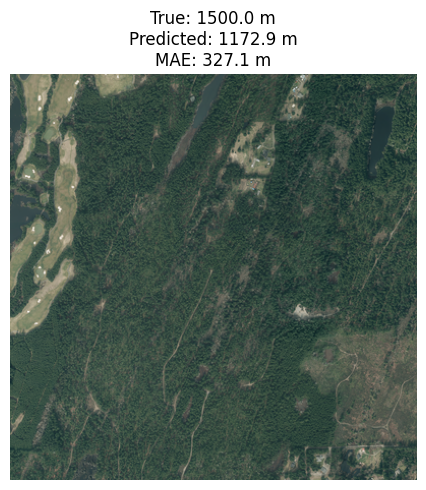

Модель сохранена как 'best_scale_regressor.pth'


In [1]:
import os
import glob
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# ----------------------------
# 1. Настройки
# ----------------------------
IMG_DIR = "Data/train/scale"
TXT_DIR = "Data/train/scale"

SCALE_MIN = 200.0
SCALE_MAX = 3000.0

BATCH_SIZE = 1  # T4 может не потянуть больше при 800x800
NUM_EPOCHS = 300
LEARNING_RATE = 1e-4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PATIENCE = 15  # для early stopping

print(f"Using device: {DEVICE}")

# ----------------------------
# 2. Сбор данных
# ----------------------------
extensions = ['.tif', '.tiff', '.jpg', '.jpeg', '.png']
image_paths = []
label_paths = []

for ext in extensions:
    for pattern in [f"*{ext}", f"*{ext.upper()}"]:
        for img_path in glob.glob(os.path.join(IMG_DIR, pattern)):
            base = os.path.splitext(os.path.basename(img_path))[0]
            txt_path = os.path.join(TXT_DIR, base + ".txt")
            if os.path.isfile(txt_path):
                image_paths.append(img_path)
                label_paths.append(txt_path)

print(f"Найдено пар изображение-метка: {len(image_paths)}")

# Загрузка всех масштабов
scales_raw = []
for p in label_paths:
    with open(p, 'r') as f:
        scales_raw.append(float(f.read().strip()))
scales_raw = np.array(scales_raw)

# ----------------------------
# 3. Стратификация
# ----------------------------
def stratify_bins(scales):
    main_low, main_high = 1400, 1600
    left_bins = np.linspace(scales.min(), main_low, 5)
    main_bins = np.linspace(main_low, main_high, 3)
    right_bins = np.linspace(main_high, scales.max(), 5)
    all_bins = np.concatenate([left_bins[:-1], main_bins, right_bins[1:]])
    return np.digitize(scales, all_bins)

stratify_labels = stratify_bins(scales_raw)

train_img, val_img, train_lbl, val_lbl = train_test_split(
    image_paths, label_paths,
    test_size=0.2,
    random_state=42,
    stratify=stratify_labels
)

# ----------------------------
# 4. Dataset
# ----------------------------
class ScaleDataset(Dataset):
    def __init__(self, image_paths, label_paths, transform=None):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)

        with open(self.label_paths[idx], 'r') as f:
            scale = float(f.read().strip())
        # Мин-макс нормализация
        scale_norm = (scale - SCALE_MIN) / (SCALE_MAX - SCALE_MIN)
        return img, torch.tensor(scale_norm, dtype=torch.float32)

# Трансформации
transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_val = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = ScaleDataset(train_img, train_lbl, transform_train)
val_dataset = ScaleDataset(val_img, val_lbl, transform_val)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# ----------------------------
# 5. Модель
# ----------------------------
class ScaleRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        try:
            from torchvision.models import resnet18, ResNet18_Weights
            weights = ResNet18_Weights.DEFAULT
            model = resnet18(weights=weights)
        except (ImportError, AttributeError):
            from torchvision.models import resnet18
            model = resnet18(pretrained=True)
        
        # Добавляем Dropout для борьбы с переобучением
        model.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(model.fc.in_features, 1)
        )
        self.model = model

    def forward(self, x):
        return self.model(x).squeeze(1)

model = ScaleRegressor().to(DEVICE)
criterion = nn.HuberLoss(delta=0.033)  # delta = 100 м в нормализованных координатах: 100 / (3000-200)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# ----------------------------
# 6. Обучение с ранней остановкой
# ----------------------------
best_val_loss = float('inf')
trigger_times = 0
history = []

for epoch in range(NUM_EPOCHS):
    # --- Обучение ---
    model.train()
    train_loss = 0.0
    for imgs, scales in train_loader:
        imgs, scales = imgs.to(DEVICE), scales.to(DEVICE)
        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, scales)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    # --- Валидация ---
    model.eval()
    val_loss = 0.0
    all_preds_norm = []
    all_trues_norm = []
    with torch.no_grad():
        for imgs, scales in val_loader:
            imgs, scales = imgs.to(DEVICE), scales.to(DEVICE)
            preds = model(imgs)
            loss = criterion(preds, scales)
            val_loss += loss.item()
            all_preds_norm.extend(preds.cpu().numpy())
            all_trues_norm.extend(scales.cpu().numpy())

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    history.append((avg_train_loss, avg_val_loss))

    # Денормализация для MAE в метрах
    all_preds = np.array(all_preds_norm) * (SCALE_MAX - SCALE_MIN) + SCALE_MIN
    all_trues = np.array(all_trues_norm) * (SCALE_MAX - SCALE_MIN) + SCALE_MIN
    mae_meters = np.mean(np.abs(all_preds - all_trues))

    print(f"Epoch {epoch+1}/{NUM_EPOCHS} | "
          f"Train Loss: {avg_train_loss:.4f} | "
          f"Val Loss: {avg_val_loss:.4f} | "
          f"Val MAE: {mae_meters:.1f} m")

    # --- Ранняя остановка ---
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        trigger_times = 0
        torch.save(model.state_dict(), "best_scale_regressor.pth")
    else:
        trigger_times += 1
        if trigger_times >= PATIENCE:
            print("Early stopping triggered!")
            break

# ----------------------------
# 7. Визуализация примера
# ----------------------------
print("\nПример предсказания на валидационных данных:")
idx = np.random.randint(len(val_img))
img_path = val_img[idx]
txt_path = val_lbl[idx]

orig_img = Image.open(img_path).convert("RGB")
display_img = orig_img.resize((400, 400), Image.LANCZOS)

with open(txt_path, 'r') as f:
    true_scale = float(f.read().strip())

input_tensor = transform_val(orig_img).unsqueeze(0).to(DEVICE)
model.eval()
with torch.no_grad():
    pred_norm = model(input_tensor).item()
    pred_scale = pred_norm * (SCALE_MAX - SCALE_MIN) + SCALE_MIN

plt.figure(figsize=(5, 5))
plt.imshow(display_img)
plt.title(f"True: {true_scale:.1f} m\nPredicted: {pred_scale:.1f} m\nMAE: {abs(true_scale - pred_scale):.1f} m", fontsize=12)
plt.axis('off')
plt.tight_layout()
plt.show()

print("Модель сохранена как 'best_scale_regressor.pth'")

In [ ]:
Стало лучше, но модель Resnet18 еще достаточно сильно ошибается. Попробуем сильно упростить модель, напишем самостоятельно простую CNN.

Using device: cuda
Найдено пар изображение-метка: 224
Epoch 1/300 | Train Loss: 0.006880 | Val Loss: 0.002731 | MAE total: 279.6 | main: 169.0 | tail: 791.5 m
Epoch 2/300 | Train Loss: 0.004098 | Val Loss: 0.002662 | MAE total: 271.9 | main: 162.5 | tail: 777.9 m
Epoch 3/300 | Train Loss: 0.003800 | Val Loss: 0.002470 | MAE total: 254.3 | main: 140.6 | tail: 780.1 m
Epoch 4/300 | Train Loss: 0.003508 | Val Loss: 0.002350 | MAE total: 244.2 | main: 124.6 | tail: 797.1 m
Epoch 5/300 | Train Loss: 0.003580 | Val Loss: 0.002341 | MAE total: 240.8 | main: 126.1 | tail: 771.3 m
Epoch 6/300 | Train Loss: 0.003562 | Val Loss: 0.002280 | MAE total: 236.6 | main: 115.6 | tail: 796.0 m
Epoch 7/300 | Train Loss: 0.003547 | Val Loss: 0.002299 | MAE total: 238.7 | main: 124.6 | tail: 766.2 m
Epoch 8/300 | Train Loss: 0.003257 | Val Loss: 0.002141 | MAE total: 222.8 | main: 101.1 | tail: 785.6 m
Epoch 9/300 | Train Loss: 0.003404 | Val Loss: 0.002212 | MAE total: 230.9 | main: 115.6 | tail: 764.4 m
E

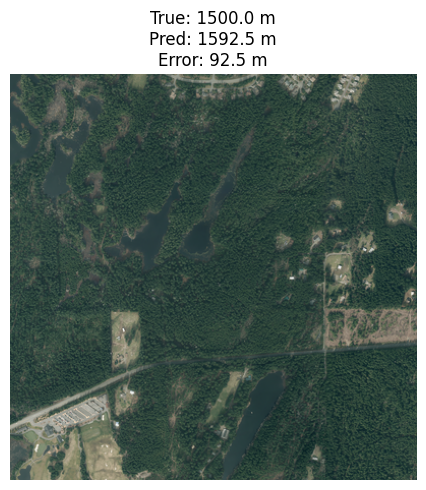

Модель сохранена как 'best_simple_cnn.pth'


In [3]:
import os
import glob
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# ----------------------------
# 1. Настройки
# ----------------------------
IMG_DIR = "Data/train/scale"
TXT_DIR = "Data/train/scale"

SCALE_MIN = 200.0
SCALE_MAX = 3000.0

BATCH_SIZE = 2  # SimpleCNN легче — можно 2 на T4
NUM_EPOCHS = 300
LEARNING_RATE = 1e-5
WEIGHT_DECAY = 1e-4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PATIENCE = 20

print(f"Using device: {DEVICE}")

# ----------------------------
# 2. Сбор данных
# ----------------------------
extensions = ['.tif', '.tiff', '.jpg', '.jpeg', '.png']
image_paths = []
label_paths = []

for ext in extensions:
    for pattern in [f"*{ext}", f"*{ext.upper()}"]:
        for img_path in glob.glob(os.path.join(IMG_DIR, pattern)):
            base = os.path.splitext(os.path.basename(img_path))[0]
            txt_path = os.path.join(TXT_DIR, base + ".txt")
            if os.path.isfile(txt_path):
                image_paths.append(img_path)
                label_paths.append(txt_path)

print(f"Найдено пар изображение-метка: {len(image_paths)}")
if len(image_paths) == 0:
    raise FileNotFoundError("Ни одного изображения не найдено! Проверьте IMG_DIR и TXT_DIR.")

# Загрузка всех масштабов
scales_raw = []
for p in label_paths:
    with open(p, 'r') as f:
        scales_raw.append(float(f.read().strip()))
scales_raw = np.array(scales_raw)

# ----------------------------
# 3. Стратификация
# ----------------------------
def stratify_bins(scales):
    main_low, main_high = 1400, 1600
    left_bins = np.linspace(scales.min(), main_low, 5)
    main_bins = np.linspace(main_low, main_high, 3)
    right_bins = np.linspace(main_high, scales.max(), 5)
    all_bins = np.concatenate([left_bins[:-1], main_bins, right_bins[1:]])
    return np.digitize(scales, all_bins)

stratify_labels = stratify_bins(scales_raw)

train_img, val_img, train_lbl, val_lbl = train_test_split(
    image_paths, label_paths,
    test_size=0.2,
    random_state=42,
    stratify=stratify_labels
)

# ----------------------------
# 4. Dataset
# ----------------------------
class ScaleDataset(Dataset):
    def __init__(self, image_paths, label_paths, transform=None):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)

        with open(self.label_paths[idx], 'r') as f:
            scale = float(f.read().strip())
        scale_norm = (scale - SCALE_MIN) / (SCALE_MAX - SCALE_MIN)
        return img, torch.tensor(scale_norm, dtype=torch.float32)

# Трансформации
transform_train = transforms.Compose([
    transforms.Resize((800, 800)),  
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_val = transforms.Compose([
    transforms.Resize((800, 800)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = ScaleDataset(train_img, train_lbl, transform_train)
val_dataset = ScaleDataset(val_img, val_lbl, transform_val)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# ----------------------------
# 5. Простая CNN для масштаба
# ----------------------------
class SimpleScaleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            # Вход: 3 x 800 x 800
            nn.Conv2d(3, 32, kernel_size=7, stride=2, padding=3),  # 32 x 400 x 400
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),      # 32 x 200 x 200

            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2), # 64 x 100 x 100
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),      # 64 x 50 x 50

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),# 128 x 25 x 25
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1))                           # 128 x 1 x 1
        )
        self.regressor = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        return self.regressor(x).squeeze(1)

model = SimpleScaleCNN().to(DEVICE)
criterion = nn.HuberLoss(delta=0.033)  # ≈100 м в нормализованных координатах
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# ----------------------------
# 6. Обучение
# ----------------------------
best_val_loss = float('inf')
trigger_times = 0

for epoch in range(NUM_EPOCHS):
    # --- Обучение ---
    model.train()
    train_loss = 0.0
    for imgs, scales in train_loader:
        imgs, scales = imgs.to(DEVICE), scales.to(DEVICE)
        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, scales)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    # --- Валидация ---
    model.eval()
    val_loss = 0.0
    all_preds_norm = []
    all_trues_norm = []
    with torch.no_grad():
        for imgs, scales in val_loader:
            imgs, scales = imgs.to(DEVICE), scales.to(DEVICE)
            preds = model(imgs)
            loss = criterion(preds, scales)
            val_loss += loss.item()
            all_preds_norm.extend(preds.cpu().numpy())
            all_trues_norm.extend(scales.cpu().numpy())

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)

    # Денормализация
    all_preds = np.array(all_preds_norm) * (SCALE_MAX - SCALE_MIN) + SCALE_MIN
    all_trues = np.array(all_trues_norm) * (SCALE_MAX - SCALE_MIN) + SCALE_MIN

    # MAE по группам
    mask_main = (all_trues >= 1400) & (all_trues <= 1600)
    mask_tail = ~mask_main

    mae_total = np.mean(np.abs(all_preds - all_trues))
    mae_main = np.mean(np.abs(all_preds[mask_main] - all_trues[mask_main])) if mask_main.any() else 0
    mae_tail = np.mean(np.abs(all_preds[mask_tail] - all_trues[mask_tail])) if mask_tail.any() else 0

    print(f"Epoch {epoch+1}/{NUM_EPOCHS} | "
          f"Train Loss: {avg_train_loss:.6f} | "
          f"Val Loss: {avg_val_loss:.6f} | "
          f"MAE total: {mae_total:.1f} | main: {mae_main:.1f} | tail: {mae_tail:.1f} m")

    # --- Ранняя остановка ---
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        trigger_times = 0
        torch.save(model.state_dict(), "best_simple_cnn.pth")
    else:
        trigger_times += 1
        if trigger_times >= PATIENCE:
            print("Early stopping!")
            break

# ----------------------------
# 7. Визуализация
# ----------------------------
print("\nПример предсказания:")
idx = np.random.randint(len(val_img))
img_path = val_img[idx]
txt_path = val_lbl[idx]

orig_img = Image.open(img_path).convert("RGB")
display_img = orig_img.resize((400, 400), Image.LANCZOS)

with open(txt_path, 'r') as f:
    true_scale = float(f.read().strip())

input_tensor = transform_val(orig_img).unsqueeze(0).to(DEVICE)
model.eval()
with torch.no_grad():
    pred_norm = model(input_tensor).item()
    pred_scale = pred_norm * (SCALE_MAX - SCALE_MIN) + SCALE_MIN

plt.figure(figsize=(5, 5))
plt.imshow(display_img)
plt.title(f"True: {true_scale:.1f} m\nPred: {pred_scale:.1f} m\nError: {abs(true_scale - pred_scale):.1f} m", fontsize=12)
plt.axis('off')
plt.tight_layout()
plt.show()

print("Модель сохранена как 'best_simple_cnn.pth'")

МАЕ 185.7 метрой считаю отличным результатом. Данную модель возьмем за основу для прогноза масштаба снимка.

Проведем рассчеты масштаба для случайных файлов тестовой выборки датасета задачи.

Найдено изображений для прогноза: 72


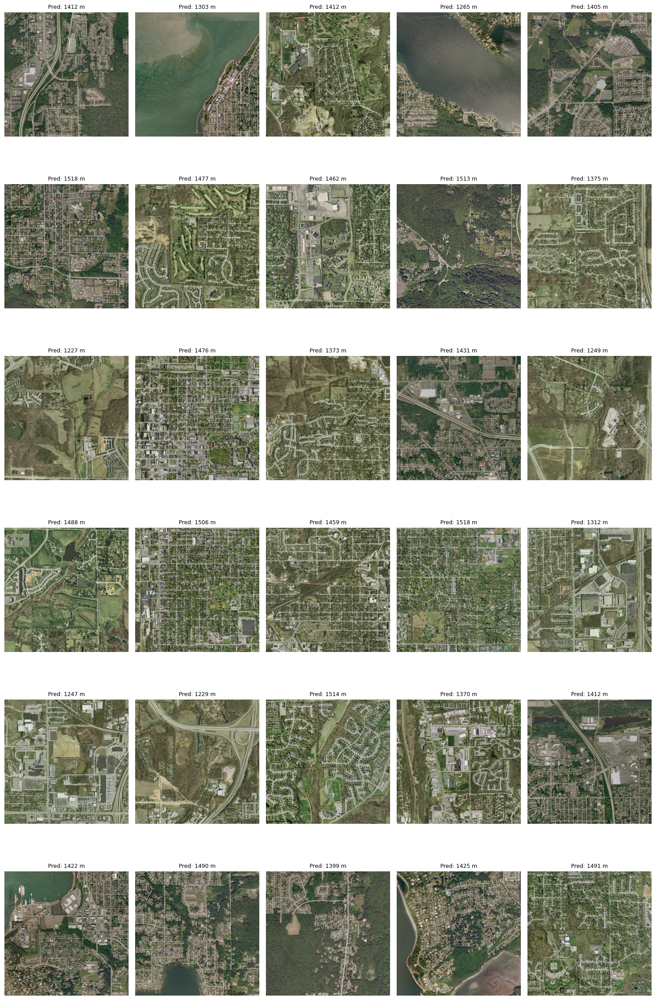

Прогноз завершён.


In [2]:
import os
import glob
import random
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# ----------------------------
# 1. Настройки
# ----------------------------
INFERENCE_DIR = "Data/test/images"  # Папка с изображениями для прогноза
MODEL_PATH = "best_simple_cnn.pth"
SCALE_MIN = 200.0
SCALE_MAX = 3000.0
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------
# 2. Модель (та же, что и при обучении)
# ----------------------------
class SimpleScaleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=7, stride=2, padding=3),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.regressor = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        return self.regressor(x).squeeze(1)

# Загрузка модели
model = SimpleScaleCNN()
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE)
model.eval()

# Трансформация: приведение к 800x800 + нормализация
transform = transforms.Compose([
    transforms.Resize((800, 800)),  и
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ----------------------------
# 3. Загрузка изображений
# ----------------------------
extensions = ['.tif', '.tiff', '.jpg', '.jpeg', '.png']
image_paths = []
for ext in extensions:
    image_paths.extend(glob.glob(os.path.join(INFERENCE_DIR, f"*{ext}")))
    image_paths.extend(glob.glob(os.path.join(INFERENCE_DIR, f"*{ext.upper()}")))

image_paths = sorted(list(set(image_paths)))
print(f"Найдено изображений для прогноза: {len(image_paths)}")

if len(image_paths) == 0:
    raise FileNotFoundError(f"Нет изображений в папке: {INFERENCE_DIR}")

# Выбираем до 30 случайных (или все, если <30)
n_show = min(30, len(image_paths))
selected_paths = random.sample(image_paths, n_show)

# ----------------------------
# 4. Прогноз и визуализация
# ----------------------------
plt.figure(figsize=(15, int(4 * (n_show / 5))))  # ~5 изображений в ряд

for i, img_path in enumerate(selected_paths):
    # Загружаем оригинал для отображения (маленький)
    orig_img = Image.open(img_path).convert("RGB")
    display_img = orig_img.copy()
    if max(display_img.size) > 400:
        display_img.thumbnail((400, 400), Image.LANCZOS)

    # Подготовка тензора 800x800
    input_tensor = transform(orig_img).unsqueeze(0).to(DEVICE)

    # Предсказание
    with torch.no_grad():
        pred_norm = model(input_tensor).item()
        pred_scale = pred_norm * (SCALE_MAX - SCALE_MIN) + SCALE_MIN

    # Проверяем наличие .txt (для сравнения, если есть)
    txt_path = os.path.splitext(img_path)[0] + ".txt"
    true_scale = None
    if os.path.exists(txt_path):
        try:
            with open(txt_path, 'r') as f:
                true_scale = float(f.read().strip())
        except:
            pass

    # Вывод
    plt.subplot((n_show + 4) // 5, 5, i + 1)
    plt.imshow(display_img)
    title = f"Pred: {pred_scale:.0f} m"
    if true_scale is not None:
        error = abs(pred_scale - true_scale)
        title += f"\nTrue: {true_scale:.0f} m\nErr: {error:.0f} m"
    plt.title(title, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Прогноз завершён.")

Покажем результаты на другом датасете, разбавленном снимками других масштабов.

Найдено изображений для прогноза: 224


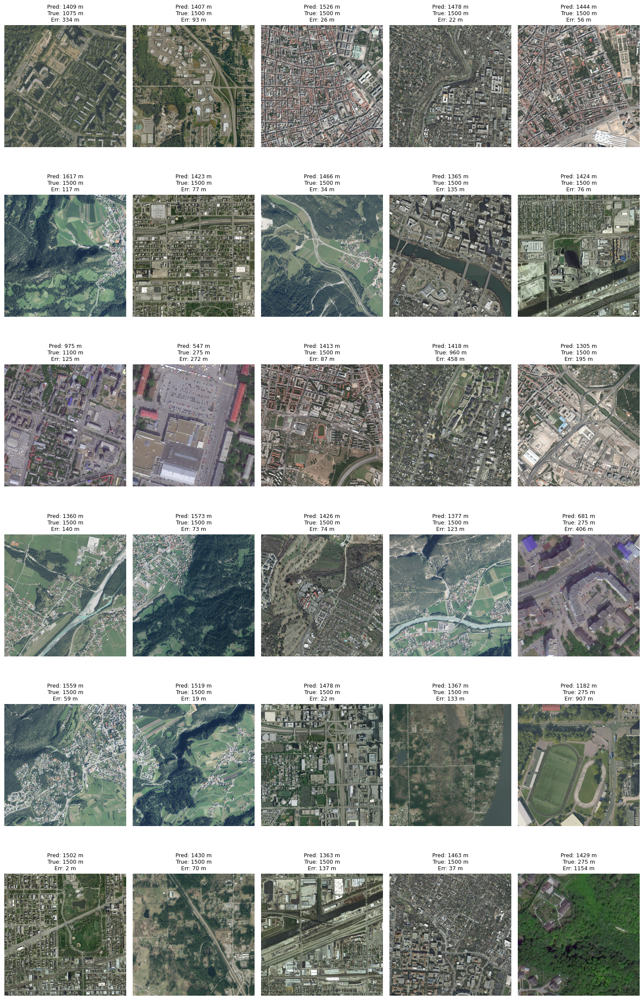

Прогноз завершён.


In [1]:
import os
import glob
import random
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# ----------------------------
# 1. Настройки
# ----------------------------
INFERENCE_DIR = "Data/train/scale"  # Папка с изображениями для прогноза
MODEL_PATH = "best_simple_cnn.pth"
SCALE_MIN = 200.0
SCALE_MAX = 3000.0
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------
# 2. Модель (та же, что и при обучении)
# ----------------------------
class SimpleScaleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=7, stride=2, padding=3),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.regressor = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        return self.regressor(x).squeeze(1)

# Загрузка модели
model = SimpleScaleCNN()
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE)
model.eval()

# Трансформация: приведение к 800x800 + нормализация
transform = transforms.Compose([
    transforms.Resize((800, 800)),  # ← ключево для совместимости
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ----------------------------
# 3. Загрузка изображений
# ----------------------------
extensions = ['.tif', '.tiff', '.jpg', '.jpeg', '.png']
image_paths = []
for ext in extensions:
    image_paths.extend(glob.glob(os.path.join(INFERENCE_DIR, f"*{ext}")))
    image_paths.extend(glob.glob(os.path.join(INFERENCE_DIR, f"*{ext.upper()}")))

image_paths = sorted(list(set(image_paths)))
print(f"Найдено изображений для прогноза: {len(image_paths)}")

if len(image_paths) == 0:
    raise FileNotFoundError(f"Нет изображений в папке: {INFERENCE_DIR}")

# Выбираем до 30 случайных (или все, если <30)
n_show = min(30, len(image_paths))
selected_paths = random.sample(image_paths, n_show)

# ----------------------------
# 4. Прогноз и визуализация
# ----------------------------
plt.figure(figsize=(15, int(4 * (n_show / 5))))  # ~5 изображений в ряд

for i, img_path in enumerate(selected_paths):
    # Загружаем оригинал для отображения (маленький)
    orig_img = Image.open(img_path).convert("RGB")
    display_img = orig_img.copy()
    if max(display_img.size) > 400:
        display_img.thumbnail((400, 400), Image.LANCZOS)

    # Подготовка тензора 800x800
    input_tensor = transform(orig_img).unsqueeze(0).to(DEVICE)

    # Предсказание
    with torch.no_grad():
        pred_norm = model(input_tensor).item()
        pred_scale = pred_norm * (SCALE_MAX - SCALE_MIN) + SCALE_MIN

    # Проверяем наличие .txt (для сравнения, если есть)
    txt_path = os.path.splitext(img_path)[0] + ".txt"
    true_scale = None
    if os.path.exists(txt_path):
        try:
            with open(txt_path, 'r') as f:
                true_scale = float(f.read().strip())
        except:
            pass

    # Вывод
    plt.subplot((n_show + 4) // 5, 5, i + 1)
    plt.imshow(display_img)
    title = f"Pred: {pred_scale:.0f} m"
    if true_scale is not None:
        error = abs(pred_scale - true_scale)
        title += f"\nTrue: {true_scale:.0f} m\nErr: {error:.0f} m"
    plt.title(title, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Прогноз завершён.")

In [ ]:
Кажется, очень хорошо. Идем дальше!